<class 'numpy.ndarray'>


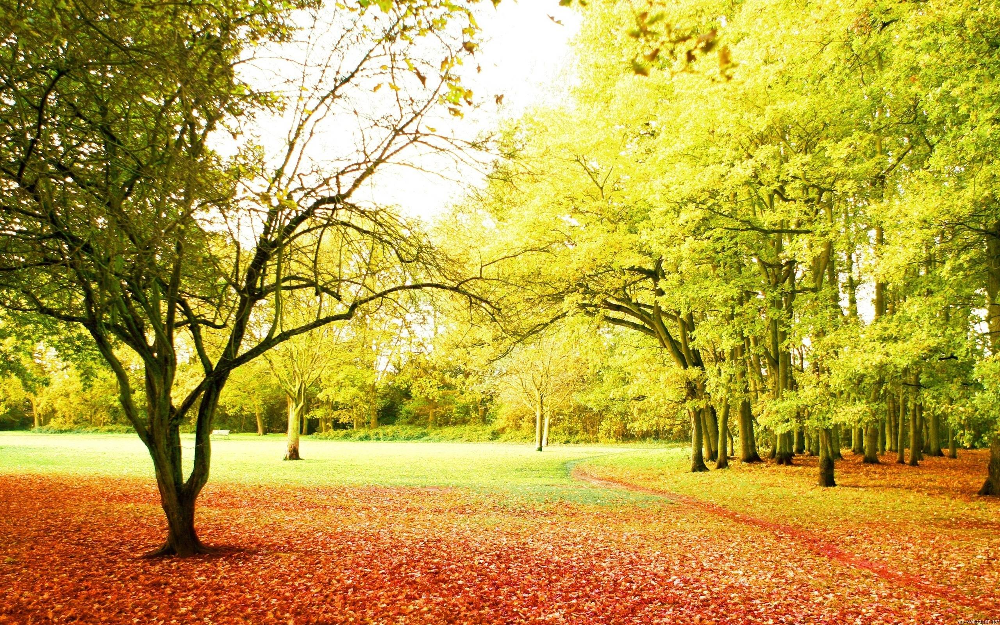

<class 'list'>


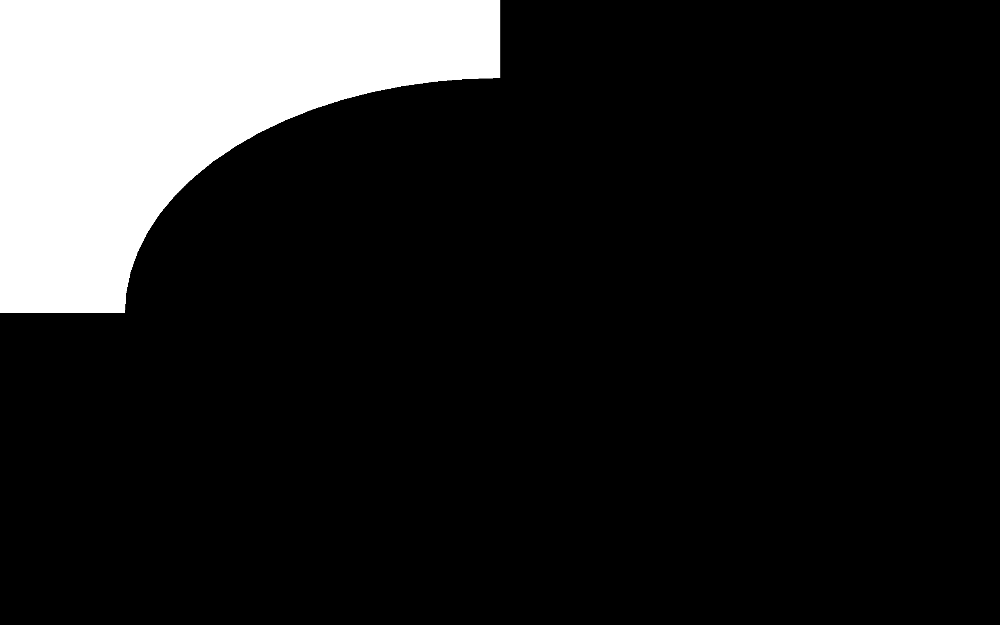

------------------------
0


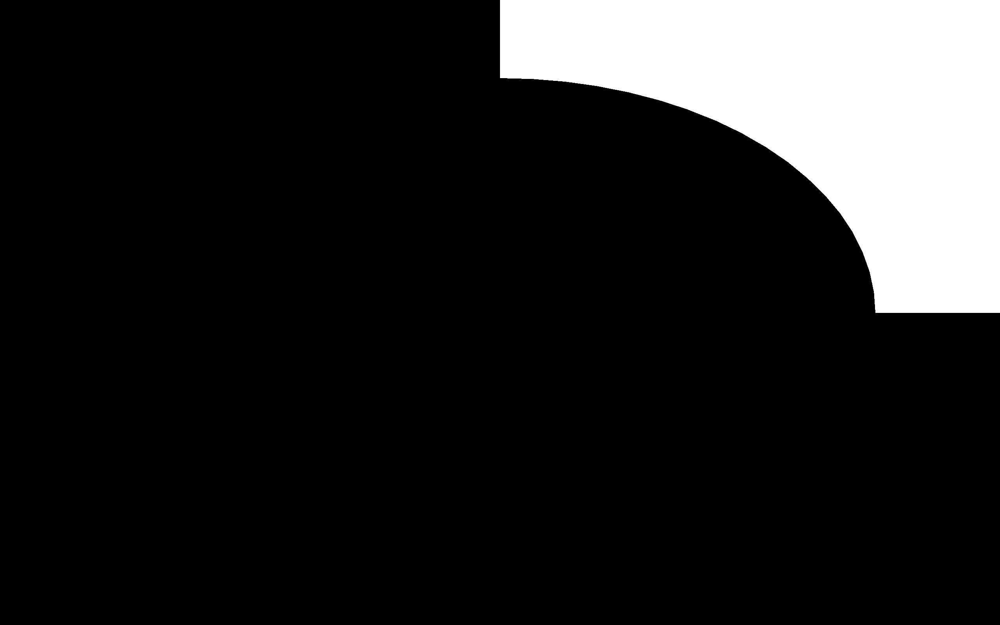

------------------------
1


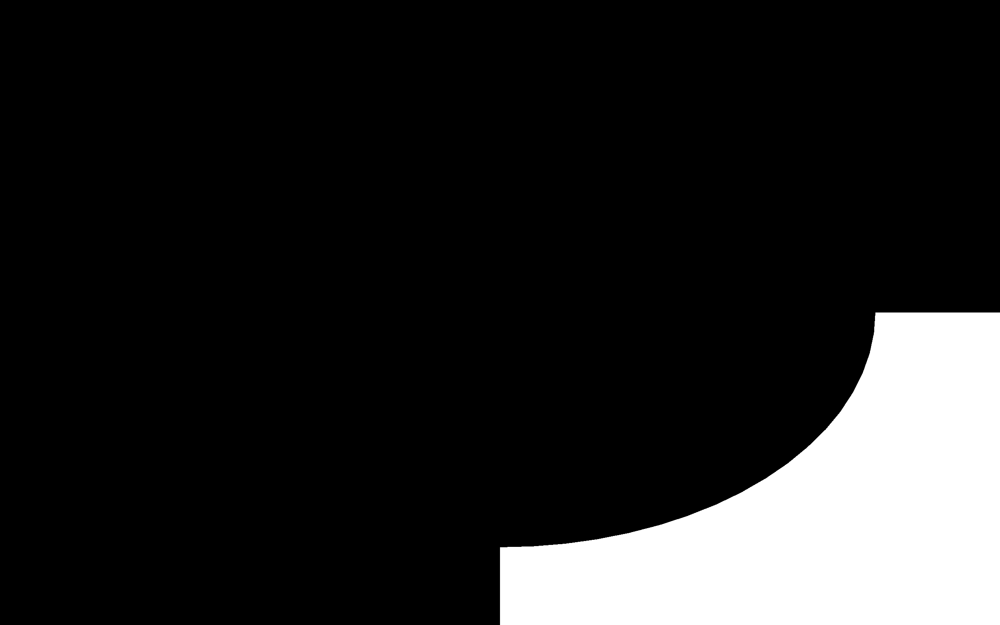

------------------------
2


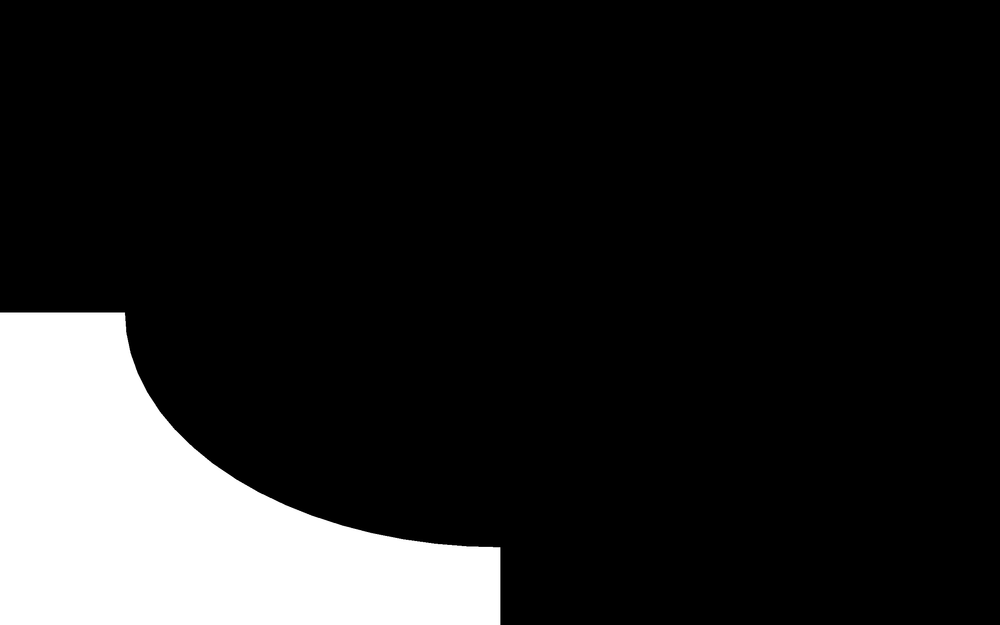

------------------------
3


<function destroyAllWindows>

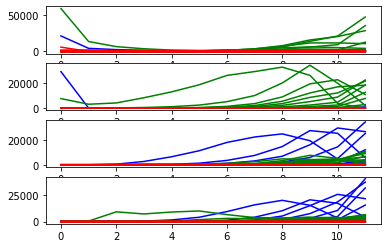

In [29]:
import numpy as np
from google.colab.patches import cv2_imshow
import cv2
import imutils
from google.colab import files
import matplotlib.pyplot as plt

# uploaded = files.upload()
# import io
img=cv2.imread('1.jpg')
print( type(img))
cv2_imshow(img)
image = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
features = []
(h, w) = img.shape[:2]
(cX, cY) = (int(w * 0.5), int(h * 0.5))
segments = [(0, cX, 0, cY), (cX, w, 0, cY), (cX, w, cY, h),
			(0, cX, cY, h)]
print(type(segments))
(axesX, axesY) = (int(w * 0.75) // 2, int(h * 0.75) // 2)
ellipMask = np.zeros(image.shape[:2], dtype = "uint8")
cv2.ellipse(ellipMask, (cX, cY), (axesX, axesY), 0, 0, 360, 255, -1)
i=0
for i,(startx,endx,starty,endy) in enumerate(segments):
	cornerMask = np.zeros(image.shape[:2], dtype = "uint8")
	cv2.rectangle(cornerMask, (startx, starty), (endx, endy), 255, -1)
	cornerMask = cv2.subtract(cornerMask, ellipMask)
	hist=cv2.calcHist([image], [0,1,2], cornerMask, (8,12,12),
			[0, 180,0,256,0,256])
 
	cv2_imshow(cornerMask)
	print ('------------------------')
	print(i)
	color=("b","g","r")
	plt.subplot(4, 1, i+1)
	for i,j in enumerate(color):
		plt.plot(hist[i],color=j)

cv2.waitKey(0)
cv2.destroyAllWindows



